# Gabor stimuli

This notebook will show examples of the Gabor wavelet stimuli for use in Figure 5

In [1]:
from run_STRF_analysis import *
import numpy as np
import h5py
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

%matplotlib inline
from scipy.io import loadmat

box_dir = '/Users/maansidesai/Box/'
figures_dir = '%s/MovieTrailersTask/Data/EEG/Paper_Submission/Figures/'%(box_dir)

print("Will save figures in %s"%figures_dir)
sfreq=128.

Will save figures in /Users/maansidesai/Box//MovieTrailersTask/Data/EEG/Paper_Submission/Figures/


In [2]:
# Path to load EEG .h5 files and save into specified folder
user = input('Enter user for computer:   ')
data_dir='/Users/%s/Box/MovieTrailersTask/Data/EEG/Participants' %(user)
save_dir = '/Users/%s/Box/MovieTrailersTask/Data/EEG/Revision_figs' %(user)

#create subject list with all participants:
# subject_list = create_subject_list(data_dir)
# print(subject_list)

Enter user for computer:   maansidesai


## Load the stimulus data

In [ ]:
gabor_stim = dict()
env_stim = dict()
pitch_stim=dict()
phnfeat_stim=dict()
with h5py.File('%s/MovieTrailersTask/Data/EEG/Participants/fullEEGmatrix.hf5'%(box_dir)) as hf:
    gabor_stim['insideout'] =  hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/gabor_pc10'][:]
    gabor_stim['paddington'] =  hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/gabor_pc10'][:]
    print([k for k in hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/']])
    env_stim['insideout'] = hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/envelope'][:]
    env_stim['paddington'] = hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/envelope'][:]
    phnfeat_stim['insideout'] = hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/phn_feat_timings'][:]
    phnfeat_stim['paddington'] = hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/phn_feat_timings'][:]
    pitch_stim['insideout'] = hf['MovieTrailers/insideout-usca-tlr2_a720p.wav/stim/pitches'][:]
    pitch_stim['paddington'] = hf['MovieTrailers/paddington-2-trailer-1_a720p.wav/stim/pitches'][:]


## Show an example from Inside Out

This will plot the gabor features and the acoustic features for a segment of time (t=21 to t=36 seconds). This is a nice example because it includes some moving items as well as text, which shows up pretty differently in both the visual and auditory features (because during the text part, there is no dialog).

In [ ]:
ntimes, npcs = gabor_stim[stim].shape

# Colormaps
cmap_audio = LinearSegmentedColormap.from_list('audio_cmap', ['white','#996666'])
cmap_visual = LinearSegmentedColormap.from_list('visual_cmap', ['#fcba03','white','black'])
# cmap_visual = cm.RdGy

# Feature labels for acoustic features
feat_labels = ['sonorant','obstruent','voiced','back','front',
               'low','high','dorsal','coronal','labial','syllabic',
               'plosive','fricative','nasal', 'env', 'F0']

# Start and end time in seconds
tstart = 21 
tend = 36
plt.figure(figsize=(13,6))
p=1
for stim in ['insideout']:#,'paddington']:
    plt.subplot(2,1,p)
    gabor = gabor_stim[stim][np.int(tstart*sfreq):np.int(tend*sfreq),:]
    #gabor = gabor/np.abs(gabor).max()
    plt.imshow(gabor.T, aspect='auto', cmap=cmap_visual, vmin=-0.08, vmax=0.08)
    xt=np.arange(0, gabor.shape[0]+sfreq*2, step=sfreq*2)
    xt=xt.astype(np.int)
    plt.gca().set_xticks(xt)
    plt.gca().set_xticklabels(np.arange(tstart, tend+2, 2))
    plt.gca().set_yticks([0,5,9])
    plt.gca().set_yticklabels([1,5,10])
    plt.gca().set_ylim([-0.5, 9.5])
    plt.gca().set_xlim([0, (tend-tstart)*sfreq])
    #plt.axvline((13.6-12)*128)
    plt.ylabel('Visual feature (Gabor PC)')
    plt.colorbar()
    p+=1

for stim in ['insideout']:#,'paddington']:
    times = np.linspace(0, ntimes/sfreq, ntimes)
    plt.subplot(2,1,p)
    phnfeat = phnfeat_stim[stim][:,np.int(tstart*sfreq):np.int(tend*sfreq)].T
    env = np.atleast_2d(env_stim[stim][np.int(tstart*sfreq):np.int(tend*sfreq)])
    env = env/env.max()
    pitch = np.atleast_2d(pitch_stim[stim][np.int(tstart*sfreq):np.int(tend*sfreq)]).T
    pitch = pitch/pitch.max()
    
    stim_stacked = np.hstack((phnfeat,env,pitch))
    
    plt.imshow(stim_stacked.T, aspect='auto', cmap=cmap_audio)
    xt=np.arange(0, gabor.shape[0]+sfreq*2, step=sfreq*2)
    xt=xt.astype(np.int)
    #print(xt)
    plt.gca().set_xticks(xt)
    plt.gca().set_xticklabels(np.arange(tstart, tend+2, 2))
    plt.gca().set_yticks(np.arange(16))
    plt.gca().set_yticklabels(feat_labels)
    plt.gca().set_ylim([-0.5, 15.5])
    plt.gca().set_xlim([0, (tend-tstart)*sfreq])
    plt.gca().invert_yaxis()
    plt.ylabel('Acoustic feature')
    plt.colorbar()
    p+=1 

plt.savefig('%s/sub-Figures/Fig5_audiovisual_features_insideout.pdf'%figures_dir)

## Load the actual Gabor wavelets and plot some examples

This shows what the original Gabor wavelets look like before we do PCA on them to get the first 10 principal components. 
Essentially, each Gabor wavelet is a drifting grating with a certain spatial and temporal frequency. The spatial frequency is how many stripes there are in space, the temporal frequency is how much they change or move over time. We have some features that are static (the first few, for example, are just blobs that appear in an image at different scales, like a big circle or a little tiny thing on the screen). The others have motion, so they could represent a large object moving quickly or slowly.

In [ ]:
gabors = loadmat('/Users/liberty/Documents/Austin/code/MovieTrailerGabors/hamilton_insideout-usca_gabors_case1.mat')
nx,ny,nt,ng = gabors['gab'].shape
print("The shape of the gabors is %d pixels by %d pixels in space x %d time slices x %d gabor wavelets"%(nx,ny,nt,ng))

In [ ]:
gab_nums = [0, 2, 7, 11,1000,1302,1305,1308,2104,2138] #1308

p = 1
plt.figure(figsize=(5,10))
fps=24 # Frames per second for movies (visual sampling rate)
t = np.arange(0,1,1/fps)
for g in gab_nums:
    #plt.figure()
    for i in np.arange(10):
        plt.subplot(20,10,p)
        plt.imshow(gabors['gab'][:,:,i,g], vmin=-1, vmax=1,cmap=cm.Greys_r)
        plt.axis('off')
        p += 1
        if g==0:
            plt.title('t=%.2f'%(t[i]),fontsize=8)
    
plt.savefig('%s/sub-Figures/Fig5_example_gabors.pdf'%(figures_dir))

## Plot the example original Gabor matrix and the PCA version

This shows a matrix of all possible Gabor wavelets over time and how they appear in the movie. There are 2139 total Gabors, only 20 are shown in the plot above. Then, we reduce the dimensionality of this matrix by doing PCA on it and selecting 10 components.

In [ ]:
tpts = np.arange(np.int(tstart*fps),np.int(tend*fps))

plt.figure(figsize=(4,2))
plt.subplot(1,2,1)
plt.imshow(gabors['S_fin'][np.int(tstart*fps):np.int(tend*fps),:].T, aspect='auto', vmin=-5, vmax=5, cmap=cmap_visual)
plt.gca().set_xticks([0, len(tpts)])
plt.gca().set_xticklabels([tstart, tend])
plt.gca().set_ylim([-0.5, gabors['S_fin'].shape[1]])
plt.ylabel('Gabor wavelet #')
plt.xlabel('Time (s)')
plt.colorbar()

tpts2 = np.arange(np.int(tstart*sfreq),np.int(tend*sfreq))
plt.subplot(1,2,2)
plt.imshow(gabor_stim['insideout'][np.int(tstart*sfreq):np.int(tend*sfreq),:].T, aspect='auto',vmin=-0.08, vmax=0.08,
           cmap=cmap_visual)
plt.gca().set_xticks([0, len(tpts2)])
plt.gca().set_xticklabels([tstart, tend])
plt.gca().set_yticks([0,5,9])
plt.gca().set_yticklabels([1,6,10])
plt.gca().set_ylim([-0.5, 9.5])
plt.xlabel('Time (s)')
plt.ylabel('Gabor PC')
plt.colorbar()

plt.tight_layout()
plt.savefig('%s/sub-Figures/Fig5_gabor_PCA.pdf'%(figures_dir))

# Figure 5D

In [5]:
subject_list = ['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005' ,'MT0006', 'MT0008', 'MT0009', 'MT0010','MT0011','MT0012', 'MT0013',
'MT0014', 'MT0015', 'MT0016', 'MT0017']
data_dir = '/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants'

3
[704 322 311 341 738 807 748 195 226 837 232 274 705 704]
[195 758 842 738 307 674 704 721  31 732 232 617 209 195]


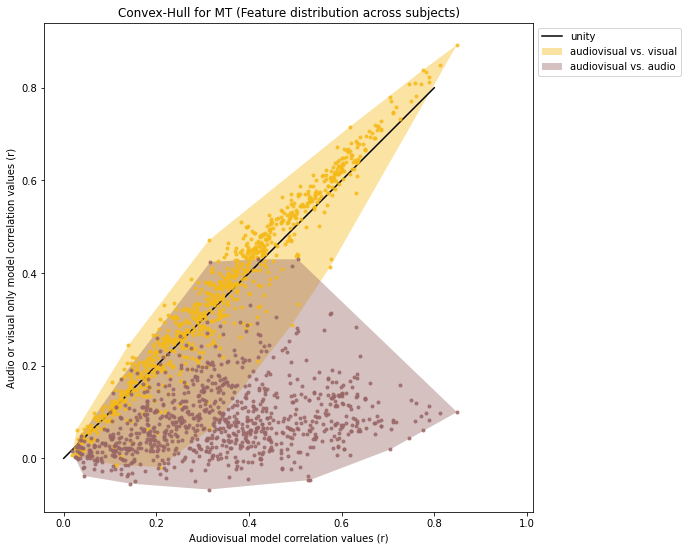

In [34]:
stimulus_class = 'MT'
fig = plt.figure(figsize=(15,9))
plt.plot([0.0, 0.8], [0.0, 0.8], 'black', label='unity') 
corrs = []
corrs_sig = []
#corrs_nonsig = []
#plot audio only vs audiovisual

for idx, s in enumerate(subject_list):
    #load cc_max for each subject:
    f = h5py.File('%s/%s/%s_STRF_by_phnfeat_%s.hf5'%(data_dir, s, s, stimulus_class), 'r')
    cc_max=f['/cc_max_%s' %(stimulus_class.lower())][:]
    with h5py.File('%s/%s/%s_STRF_by_audiovisual_gabor_sc_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as fh: #full audiovisual model: auditory + scene cut + gabpr
        corrs_audiovisual = fh['corrs_%s' %(stimulus_class.lower())][:]/cc_max  
        p_vals_audiovisual =  fh['pvals_%s' %(stimulus_class.lower())][:]
        #audiovisual_nonsig = (corrs_audiovisual[np.where(p_vals_audiovisual[0] > 0.05)])
        audiovisual_sig = (corrs_audiovisual[np.where(p_vals_audiovisual[0] < 0.05)])
        
    with h5py.File('%s/%s/%s_STRF_by_scene_cut_gabor_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as fh: #full visual model
        corrs_visual = fh['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_vals_visual =  fh['pvals_%s' %(stimulus_class.lower())][:]
        #visual_nonsig = (corrs_visual[np.where(p_vals_audiovisual[0] > 0.05)])
        visual_sig = (corrs_visual[np.where(p_vals_audiovisual[0] < 0.05)])
    
    with h5py.File('%s/%s/%s_STRF_by_binned_pitches_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as fh: #full auditory model
        corrs_audio = fh['corrs_%s_norm' %(stimulus_class.lower())][:]  
        p_vals_audio =  fh['pvals_%s' %(stimulus_class.lower())][:]
        #audio_nonsig = (corrs_audio[np.where(p_vals_audiovisual[0] > 0.05)])
        audio_sig = (corrs_audio[np.where(p_vals_audiovisual[0] < 0.05)])

    corrs.append([corrs_audiovisual, corrs_visual, corrs_audio])
    #corrs_nonsig.append([audiovisual_nonsig, visual_nonsig, audio_nonsig])
    corrs_sig.append([audiovisual_sig,visual_sig, audio_sig])
    
points = np.hstack(corrs).T
points_sig = np.hstack(corrs_sig).T
#points_nonsig = np.hstack(corrs_nonsig).T

print(points.shape[1])

hull1=ConvexHull(np.vstack((points_sig[:,0] , points_sig[:,1])).T)
hullv1 = hull1.vertices.copy()
hullv1 = np.append(hullv1, hullv1[0])
print(hullv1)

hull2=ConvexHull(np.vstack((points_sig[:,0] , points_sig[:,2])).T)
hullv2 = hull2.vertices.copy()
hullv2 = np.append(hullv2, hullv2[0])
print(hullv2)

plt.fill(points_sig[hullv1,0], points_sig[hullv1,1], facecolor='#f5ba19', alpha=0.4, zorder=1, label='audiovisual vs. visual') #envs

plt.fill(points_sig[hullv2,0], points_sig[hullv2,2], facecolor='#996666', alpha=0.4, zorder=2, label='audiovisual vs. audio') #pitch


    
plt.plot(points_sig[:,0], points_sig[:,1], '.', color='#f5ba19', alpha=0.8) 
plt.plot(points_sig[:,0], points_sig[:,2], '.', color='#996666', alpha=0.8) 

# plt.plot(points_nonsig[:,0], points_nonsig[:,1], '.', color='#DCDBDB', alpha=0.8) 
# plt.plot(points_nonsig[:,0], points_nonsig[:,2], '.', color='#DCDBDB', alpha=0.8) 

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.xlabel('Audiovisual model correlation values (r)')
plt.ylabel('Audio or visual only model correlation values (r)')
plt.title('Convex-Hull for %s (Feature distribution across subjects)' %(stimulus_class))
plt.axis('square') 

save_dir = '/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Revision_figs'
#plt.savefig('%s/audiovis_aud-vis_only_convexHull_wSceneCuts_gabor.pdf' %(save_dir))

In [ ]:
print('The average performance score for full auditory model is: ')
print(points[:,2].mean())

print('The average performance score for the visual (scene cut + gabors) is: ')
print(points[:,1].mean())

print('The average performance score for full audiovisual model is: ')
print(points[:,0].mean())

In [ ]:
#Wilcoxon rank-sum statistical test to compare 
print(pg.wilcoxon(points[:,2], points[:,0])) #stat comparison of audio only vs AV
print(pg.wilcoxon(points[:,1], points[:,0])) #stat conmparison of visual only vs AV


# Figure 5E (Bar plot + Venn Diagram)

In [47]:
stimulus_class = 'MT'
subject_list = ['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005' ,'MT0006', 'MT0008', 'MT0009', 'MT0010','MT0011','MT0012', 'MT0013',
'MT0014', 'MT0015', 'MT0016', 'MT0017']
variance_partition = []

for idx, s in enumerate(subject_list):
    f = h5py.File('%s/%s/%s_STRF_by_phnfeat_%s.hf5'%(data_dir, s, s, stimulus_class), 'r')
    cc_max=f['/cc_max_%s' %(stimulus_class.lower())][:]
    with h5py.File('%s/%s/%s_STRF_by_binned_pitches_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as h: #full auditory model
        corr_full = h['corrs_%s_norm' %(stimulus_class.lower())][:] 
        p_val_full = h['pvals_%s' %(stimulus_class.lower())][:]  
    with h5py.File('%s/%s/%s_STRF_by_audiovisual_gabor_sc_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as h: #full + gabor model
        corr_gabor = h['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_val_gabor = h['pvals_%s' %(stimulus_class.lower())][:]  
    with h5py.File('%s/%s/%s_STRF_by_scene_cut_gabor_%s.hf5'%(data_dir, s, s, stimulus_class), 'r') as h: #gabor only model
        corr_gabor_only = h['corrs_%s' %(stimulus_class.lower())][:]/cc_max
        p_val_gabor_only = h['pvals_%s' %(stimulus_class.lower())][:]  
    sig_corrs_gabor = ([np.where (p_val_gabor[0] < 0.05)])
    gabor_model = corr_gabor[sig_corrs_gabor]
    full_model = corr_full[sig_corrs_gabor]
    dummy = np.zeros(full_model.shape)
#     print(dummy.shape)
#     print(full_model.shape)
    gabor_only = corr_gabor_only[sig_corrs_gabor]
    variance_partition.append(np.array([full_model, gabor_only, dummy, gabor_model, dummy, dummy, dummy]))

<ipython-input-47-2db2bcfbb832>:19: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  gabor_model = corr_gabor[sig_corrs_gabor]
<ipython-input-47-2db2bcfbb832>:20: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  full_model = corr_full[sig_corrs_gabor]
<ipython-input-47-2db2bcfbb832>:24: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a differen

In [48]:
rsq_corr = lambda c: (c ** 2) * np.sign(c)
venn_diagram = []
for idx, s in enumerate(subject_list):
    corr_est = np.squeeze(variance_partition[idx])
#     print(corr_est.shape)
    corr_biases, corr_orig_parts, corr_fixed_parts = correct_rsqs(rsq_corr(np.array(corr_est)), neg_only=False)
    venn_diagram.append(corr_fixed_parts.mean(1))



0 / 54
0 / 64
0 / 62
0 / 61
0 / 61
0 / 61
0 / 64
0 / 57
0 / 64
0 / 60
0 / 59
0 / 58
0 / 28
0 / 62
0 / 60
0 / 62


## Venn Diagram

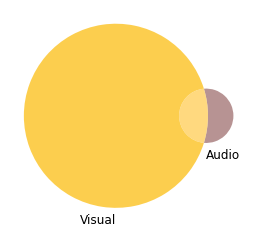

In [49]:
from matplotlib_venn import venn2
venn_avg = np.array(venn_diagram).mean(0)
v=venn2(subsets = (venn_avg[1], venn_avg[0], venn_avg[3]), set_labels = ('Visual', 'Audio', 'Audiovisual'), 
        set_colors=('#fcba03', '#996666'), alpha=0.7)
for idx, subset in enumerate(v.subset_labels):
    v.subset_labels[idx].set_visible(False)
    
plt.savefig('%s/gabor_vennDiagram_wSceneCut_and_gabor.pdf' %(save_dir))

## Barplot

<Figure size 1440x576 with 0 Axes>

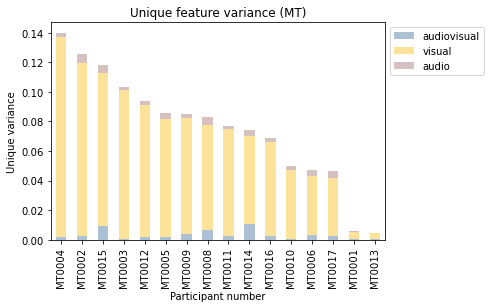

In [50]:
n_groups = len(subject_list)
opacity=0.4


plt.figure(figsize=(20,8))


index = np.arange(n_groups)

bar_width = 0.28


audio = []
visual = []
audioVisual = []

for idx, s in enumerate(subject_list):
    visual.append(venn_diagram[idx][1]) #visual only - [1]
    audio.append(venn_diagram[idx][0]) #audio only - [0]
    audioVisual.append(venn_diagram[idx][3]) #audio/visual - [3]

df = pd.DataFrame(list(zip(audio, visual, audioVisual, np.array(audio) + np.array(visual) + np.array(audioVisual))), 
columns=['audiovisual','visual', 'audio',  'sum']) #create dataframe from list
df.index = subject_list 

my_colors = ['#336699','#fcba03', '#996666']
df.sort_values(by='sum', ascending=False)[['audiovisual','visual', 'audio']].plot(kind='bar', stacked=True, color=my_colors, alpha=opacity, width=0.5)


plt.xlabel('Participant number')
plt.ylabel('Unique variance')
plt.title('Unique feature variance (%s)' %(stimulus_class))

#plt.xticks(np.arange(len(subject_list)), np.array(subject_list), rotation=90)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

##############
# rects1 = plt.bar(index - bar_width, visual, bar_width,  alpha=opacity, color='#fcba03', label='visual')

# rects2 = plt.bar(index , audio, bar_width,  alpha=opacity, color='#996666',label='audio')

# rects3 = plt.bar(index + bar_width, audioVisual, bar_width, alpha=opacity, color='#336699',label='audiovisual')

# plt.xlabel('Participant number')
# plt.ylabel('Unique variance')
# plt.title('Unique feature variance (%s)' %(stimulus_class))

# plt.xticks(np.arange(len(subject_list)), subject_list, rotation=90)
# plt.gca().set_xticks(index)
# plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
# plt.savefig('%s/AVgabor_and scene_cut_barplot.pdf' %(save_dir))

# Figure 5F

In [4]:
#THIS FUNCTION WORKS FOR FIG 5 CROSS-PREDICTION --  update!
def cross_prediction_ConvexHull(stimulus_class, subject_list, test_cond, train_cond, test_feature, train_feature, 
                                data_dir, save_dir, opacity=0.4):

    """
    Parameters
    -----------
    data_dir : string
    subject_list : string
        - inputted from create_subject_list function - loops through all participants
    stimulus_class : string 
        - specify for type of plot size + corr max/min and plot label
        - either: TIMIT or MovieTrailers
        - This condition will be the same as test_cond (below)
    test_cond : string 
        - (either as TIMIT or MT) where train_cond will be the opposite condition
        - Specify condition, where the .h5 file correlations are the values used to train your model
        - original correlation values from .h5 file (for specific condition) will be used for plotting
    train_cond : string 
        - (either as TIMIT or MT) where test_cond will be the opposite condition
        - new correlation values will be predicted here and used for plotting=
    feature : string 
        - individual feature used for reading .h5 file and for training/testing 
        - defaults: (envs, phnfeat, pitch, or pitchenvsphnfeat[for the full model])
            - (name of feature to run from .h5 file - must label exactly as .h5 name)
    opacity : float
        - transparency for all colors in bar plot 
        (default: 0.4)
    save_fig : bool 
        - outputs figure/plot when True
        (default : True)
    save_dir : string 
        -change this to match where to save the plot for each condition in PDF format 

    Returns
    -------
    ConvexHull Plot showing cross prediction of conditions on an individual feature basis 

    """

    corrs = []
    corrs_sig = []
    corrs_nonsig = []

    corrs_train_less = []
    corrs_test_less = []
    #loop through subject list
    for idx, s in enumerate(subject_list):
        f = h5py.File('%s/%s/%s_STRF_by_phnfeat_%s.hf5'%(data_dir, s, s, stimulus_class), 'r')
        cc_max=f['/cc_max_%s' %(stimulus_class.lower())][:]
        with h5py.File('%s/%s/%s_STRF_by_%s_%s.hf5'%(data_dir, s, s, test_feature, test_cond), 'r') as fh:
            wts_test = fh['wts_%s' %(test_cond.lower())][:]
            corrs_test = fh['corrs_%s_norm' %(test_cond.lower())][:]
            cc_max = fh['cc_max_%s' %(test_cond.lower())][:]
            training_test = fh['train_inds_%s' %(test_cond.lower())][:]
            validation_test = fh['val_inds_%s' %(test_cond.lower())][:]
            pval_test = fh['pvals_%s' %(test_cond.lower())][:]
            test_nonsig = np.where(pval_test[0] > 0.05)
            test_sig = np.where(pval_test[0] < 0.05)
        with h5py.File('%s/%s/%s_STRF_by_%s_%s.hf5'%(data_dir, s, s, train_feature, train_cond), 'r') as h:
            wts_train = h['wts_%s' %(train_cond.lower())][:]
            corrs_train = h['corrs_%s' %(train_cond.lower())][:]/cc_max
            training_train = h['train_inds_%s' %(train_cond.lower())][:]
            validation_train = h['val_inds_%s' %(train_cond.lower())][:]

        print('*************************')
        print('Now processing %s' %(s))
        print('*************************')

        delay_min = 0.0
        delay_max = 0.6
        wt_pad = 0.0 # Amount of padding for delays, since edge artifacts can make weights look weird

        fs = 128.0
        delays = np.arange(np.floor((delay_min-wt_pad)*fs), np.ceil((delay_max+wt_pad)*fs), dtype=np.int) #create array to pass time delays in   

        if train_feature == 'phnfeat':
            plot_color = '#cd1a1e'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                                 binaryfeatmat = True, binarymat=False, envelope=False, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=False, spectrogram_scaled=False, scene_cut=False)
        if train_feature == 'envs':
            plot_color = '#808080'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                                 binaryfeatmat = False, binarymat=False, envelope=True, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=False, spectrogram_scaled=False, scene_cut=False)

        if train_feature == 'binned_pitch_only':
            plot_color = '#64a7bc'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                                 binaryfeatmat = False, binarymat=False, envelope=False, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=True, spectrogram_scaled=False, scene_cut=False)
        if train_feature == 'binned_pitches':
            plot_color = '#996666'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                     binaryfeatmat = True, binarymat=False, envelope=True, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=True, spectrogram_scaled=False, scene_cut=False)
                #if stimulus_class == 'TIMIT':
        if train_feature == 'gabor_only':
            plot_color = '#6a0dad'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                     binaryfeatmat=False, binarymat=False, envelope=False, pitch=False, gabor_pc10=True, spectrogram=False, binned_pitches=False, spectrogram_scaled=False, scene_cut=False)
        if train_feature == 'audiovisual_gabor_sc':
            plot_color = '#fcba03'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                     binaryfeatmat=True, binarymat=False, envelope=True, pitch=False, gabor_pc10=True, spectrogram=False, binned_pitches=True, spectrogram_scaled=False, scene_cut=True)

            print("For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info")
            print(wts_test.shape)
            print(wts_train.shape)
            nfeats_test = np.int(wts_test.shape[0]/len(delays))
            print(nfeats_test)
            wts_train = wts_train.reshape(len(delays),-1,wts_train.shape[1])[:,:nfeats_test,:]
            wts_train = wts_train.reshape(-1, wts_train.shape[2])
            print(wts_train.shape)

        if test_feature == 'phnfeat':
            plot_color = '#cd1a1e'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                                 binaryfeatmat = True, binarymat=False, envelope=False, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=False, spectrogram_scaled=False, scene_cut=False)
        if test_feature == 'envs':
            plot_color = '#808080'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                                 binaryfeatmat = False, binarymat=False, envelope=True, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=False, spectrogram_scaled=False, scene_cut=False)
        if test_feature == 'binned_pitch_only':
            plot_color = '#64a7bc'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                                 binaryfeatmat = False, binarymat=False, envelope=False, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=True, spectrogram_scaled=False, scene_cut=False)
        if test_feature == 'binned_pitches':
            plot_color = '#996666'
            resp_dict, stim_dict = loadEEGh5(s, stimulus_class, data_dir, eeg_epochs=True, resp_mean = True,
                                                     binaryfeatmat = True, binarymat=False, envelope=True, pitch=False, gabor_pc10=False, spectrogram=False, binned_pitches=True, spectrogram_scaled=False, scene_cut=False)


        #check that all resp_dict/neural epochs exist for all participants 
        all_stimuli = []
        for i in resp_dict.keys():
            x = (i if resp_dict[i] else 'False')
            if x != 'False':
                all_stimuli.append(x)
        vResp = np.hstack([resp_dict[r][0] for r in [all_stimuli[m] for m in validation_test]]).T


        # Create validation stimulus matrices

        if test_feature == 'binned_pitches':
            vStim_temp = np.atleast_2d(np.vstack([np.vstack(stim_dict[r]).T for r in [all_stimuli[m] for m in validation_test]]))
        else:
            vStim_temp = np.atleast_2d(np.vstack([stim_dict[r][0].T for r in [all_stimuli[m] for m in validation_test]])) 
        vStim = make_delayed(vStim_temp, delays)
        print('******************************')
        print(wts_train.shape)
        print(vStim.shape)
        print(vResp.shape)
        print('******************************')
        test_condition_corrs, train_condition_pred = predict_response(wts_train, vStim, vResp) 
        test_condition_corrs = test_condition_corrs/cc_max #divide test condition normalized correlation by the max corr value calculated from noise ceiling analysis 

        #load channel names from ICAed EEG data
        ds = load_ICA_data(s, data_dir)
        if 'STI 014' in ds.info['ch_names']:
            ds.drop_channels(['vEOG', 'hEOG', 'STI 014'])
        else:
            ds.drop_channels(['vEOG', 'hEOG'])

        chnames = ds.info['ch_names']
        chnames = np.array(chnames)

        corrs_train_less.append(chnames[np.where(corrs_test < 0)[0]])
        corrs_test_less.append(chnames[np.where(test_condition_corrs < 0)[0]])

        corrs.append([corrs_test, test_condition_corrs])
        corrs_nonsig.append([corrs_test[test_nonsig], test_condition_corrs[test_nonsig]])
        corrs_sig.append([corrs_test[test_sig], test_condition_corrs[test_sig]])

    points = np.hstack(corrs).T

    
    return corrs, corrs_sig, corrs_nonsig, corrs_train_less, corrs_test_less

In [37]:

subject_list = ['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005' ,'MT0006', 'MT0008', 'MT0009', 'MT0010','MT0011','MT0012', 'MT0013',
'MT0014', 'MT0015', 'MT0016']

#audiovisual:
corrs_av, av_sig, av_nonsig, av_corrs_train_less, av_corrs_test_less = cross_prediction_ConvexHull('TIMIT', subject_list, 'TIMIT', 'MT',  'binned_pitches', 'audiovisual_gabor_sc',data_dir, save_dir)

#audio only:
corrs_audio, aud_sig, aud_nonsig, aud_corrs_train_less, aud_corrs_test_less =  cross_prediction_ConvexHull('TIMIT', subject_list, 'TIMIT', 'MT', 'binned_pitches', 'binned_pitches',  data_dir,save_dir)


*************************
Now processing MT0001
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjk

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 32

  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_na


(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
binned pitch shape is:
(204, 10)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
binned pitch shape is:
(160, 10)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
binned pitch shape is:
(240, 10)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats


  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_na

(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 18

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"


phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"


binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
b

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 33

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
bin

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
b

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fd

phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 24

(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the

(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the m

phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 

envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatma

phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 3

envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
******************************
(1925, 64)
(2134, 1925)
(2134, 64)
******************************
Calculating prediction...
Calculating correlation
Opening raw data file /User

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0001/downsampled_128/MT0001_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 450328 =      0.000 ...  3518.188 secs
Ready.
Reading 0 ... 450328  =      0.000 ...  3518.188 secs...
*************************
Now processing MT0002
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
binned pitch shape is:
(204, 10)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking t

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
binned pitch shape is:
(160, 10)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
binned pitch shape is:
(240, 10)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
env

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 29

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
ph

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 30

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
binned pitch shape is:
(193, 10)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking th

envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat

(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the m

(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the

(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking th

(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0002/downsampled_128/MT0002_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604351 =      0.000 ...  4721.492 secs
Ready.
Reading 0 ... 604351  =      0.000 ...  4721.492 secs...
*************************
Now processing MT0003
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
en

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the me

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fda

(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the 

(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the

phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 3

envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the

(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the m

phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 2

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 526405 =      0.000 ...  4112.539 secs
Ready.
Reading 0 ... 526405  =      0.000 ...  4112.539 secs...
*************************
Now processing MT0004
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
binned pitch shape is:
(160, 10)
taking the mean across repeats
(64, 160

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 23

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
en

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0

phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 22

(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the

(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the m

(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the

(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking th

(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the

(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
******************************
(1925, 64)
(2134, 1925)
(2134, 64)
******************************
Calculating prediction...
Calculating correlation
Opening raw data file /Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0004/downsampled_128/MT0004_

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0004/downsampled_128/MT0004_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 594629 =      0.000 ...  4645.539 secs
Ready.
Reading 0 ... 594629  =      0.000 ...  4645.539 secs...
*************************
Now processing MT0005
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
p

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean acr

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the

  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_na

(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 32

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 33

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch sh

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatma

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si161

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the 

(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking th

(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the

(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the 

(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the 

(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0005/downsampled_128/MT0005_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604869 =      0.000 ...  4725.539 secs
Ready.
Reading 0 ... 604869  =      0.000 ...  4725.539 secs...
*************************
Now processing MT0006
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
binned pitch shape is:
(204, 10)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0_si2209.wav', 'fjas0_si2030.wav', 'fjhk0_si1652.wav', 'fjkl0_si1562.wav', 'fjkl0_si2192.wav', 'fjlg0_si1506.wav', 'fjlg0_si2306.wav', 'fjlr0_si1861.wav', 'fjr

(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking th

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 2

phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(


envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat

(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the m

phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 2

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0006/downsampled_128/MT0006_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 605067 =      0.000 ...  4727.086 secs
Ready.
Reading 0 ... 605067  =      0.000 ...  4727.086 secs...
*************************
Now processing MT0008
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 19

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
binned pitch shape is:
(204, 10)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
binned pitch shape is:
(160, 10)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
p

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 30

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 33

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean ac

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.

(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the

(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the 

(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the

(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the m

(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the 

(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the 

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0008/downsampled_128/MT0008_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 601304 =      0.000 ...  4697.688 secs
Ready.
Reading 0 ... 601304  =      0.000 ...  4697.688 secs...
*************************
Now processing MT0009
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
binned pitch shape is:
(204, 10)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the me

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the

(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the

(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the 

(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the

(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the me

(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking th

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0009/downsampled_128/MT0009_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631384 =      0.000 ...  4932.688 secs
Ready.
Reading 0 ... 631384  =      0.000 ...  4932.688 secs...
*************************
Now processing MT0010
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
bi

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
bi

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 3

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 1

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0

(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking th

(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the m

(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the

(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking th

(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking th

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0010/downsampled_128/MT0010_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631800 =      0.000 ...  4935.938 secs
Ready.
Reading 0 ... 631800  =      0.000 ...  4935.938 secs...
*************************
Now processing MT0011
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking t

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the

(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the 

phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 3

(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking th

(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the

binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
env

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0011/downsampled_128/MT0011_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 636479 =      0.000 ...  4972.492 secs
Ready.
Reading 0 ... 636479  =      0.000 ...  4972.492 secs...
*************************
Now processing MT0012
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
fetb0_si1148.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
binned pitch shape is:
(160, 10)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
binned pitch shape is:
(240, 10)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the 

  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_na

(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
bi

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch sh

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
mrjh0_si914.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mrjm0_si1095.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 234)
faem0_si2022.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
binned pitch shape is:
(193, 10)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the

binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
env

(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the 

(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(


(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)


(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking th

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0012/downsampled_128/MT0012_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631525 =      0.000 ...  4933.789 secs
Ready.
Reading 0 ... 631525  =      0.000 ...  4933.789 secs...
*************************
Now processing MT0013
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean acr

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav

(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the 

(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the 

(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking th

(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the

(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the 

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0013/downsampled_128/MT0013_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 536895 =      0.000 ...  4194.492 secs
Ready.
Reading 0 ... 536895  =      0.000 ...  4194.492 secs...
*************************
Now processing MT0014
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fjre0_si1746.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fjrp1_si802.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si2114.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsj0_si854.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fjsp0_si1763.wav
phnfeatmat shape is:
(14, 160)
envs shape is:
(160, 1)
binned pitch shape is:
(160, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 278)
mrjm4_si1489.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 2

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights be

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"


(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the

(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking th

(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mbpm0_si1577.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mbth0_si757.wav
phnfeatmat shape is:
(14, 271)
envs shape is:
(271, 1)
binned pitch shape is:
(271, 10)
taking the mean across repeats
(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the 

(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking th

(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the

(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the 

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0014/downsampled_128/MT0014_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 740894 =      0.000 ...  5788.234 secs
Ready.
Reading 0 ... 740894  =      0.000 ...  5788.234 secs...
*************************
Now processing MT0015
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 300)
fjhk0_si1652.wav
phnfeatmat shape is:
(14, 204)
envs shape is:
(204, 1)
binned pitch shape is:
(204, 10)
taking the mean across repeats
(64, 204)
fjkl0_si1562.wav
phnfeatmat shape is:
(14, 159)
envs shape is:
(159, 1)
binned pitch shape is:
(159, 10)
taking the mean across repeats
(64, 159)
fjkl0_si2192.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si1506.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
fjlg0_si2306.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
fjlr0_si1861.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fjrb0_si672.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 264)
marc0_si1188.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
marc0_si1818.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
marw0_si646.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
bi

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking t

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean acr

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the me

  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_na

For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights because TIMIT has no visual info
(1925, 64)
(2772, 64)
25
(1925, 64)
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fgrw0_si1990.wav', 'fhlm0_si1560.wav', 'fisb0

(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the

(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the

(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the

(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0015/downsampled_128/MT0015_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 712146 =      0.000 ...  5563.641 secs
Ready.
Reading 0 ... 712146  =      0.000 ...  5563.641 secs...
*************************
Now processing MT0016
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 330)
fgcs0_si856.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
fgjd0_si1179.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgmd0_si2107.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fgrw0_si1990.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
fhlm0_si1560.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fisb0_si2209.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
fjas0_si2030.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(160, 10)
taking the mean across repeats
(64, 160)
fjwb1_si2055.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
fkfb0_si2238.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
fklc0_si2245.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fklc1_si1678.wav
phnfeatmat shape is:
(14, 240)
envs shape is:
(240, 1)
binned pitch shape is:
(240, 10)
taking the mean across repeats
(64, 240)
fklc1_si2308.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
flac0_si2161.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)


Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
b

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitc

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 170)
mgjf0_si776.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mglb0_si2164.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mgrp0_si1947.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch 

  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_na

(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch s

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 244)
mrjm4_si2119.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g

taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
For the cross-prediction from MT to TIMIT for gabors, we remove the visual weights be

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/gabor_pc10' %(stimulus_class, wav_name)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: "Unable to open object (object 'gabor_pc10' doesn't exist)"
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 172, in loadEEGh5
    gabor_pc10_mat = fh['/%s/%s/stim/g


(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the

(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmah0_si1289.wav
phnfeatmat shape is:
(14, 239)
envs shape is:
(239, 1)
binned pitch shape is:
(239, 10)
taking the mean across repeats
(64, 239)
fmbg0_si1790.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
en

(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking th

(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking th

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0016/downsampled_128/MT0016_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 721106 =      0.000 ...  5633.641 secs
Ready.
Reading 0 ... 721106  =      0.000 ...  5633.641 secs...
*************************
Now processing MT0001
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs

phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324

(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcmb0_si1898.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mcrc0_si1092.wav
phnfeatmat shape is:
(14, 223)
envs shape is:
(223, 1)
binned pitch shape is:
(223, 10)
taking the mean across repeats
(64, 223)
mcth0_si1839.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the

phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mges0_si1481.wav
phnfeatmat shape is:
(14, 170)
envs shape is:
(170, 1)
binned pitch shape is:
(170, 10)
taking the mean across repeats
(64, 17

(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mklr0_si2319.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mkls0_si1533.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mklt0_si1213.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the m

phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mrjo0_si1624.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mrjs0_si1523.wav
phnfeatmat shape is:
(14, 146)
envs shape is:
(146, 1)
binned pitch shape is:
(146, 10)
taking the mean across repeats
(64, 146)
mrjt0_si1805.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 

(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the 

(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the

(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the

(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking th

(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the 

(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0001/downsampled_128/MT0001_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 450328 =      0.000 ...  3518.188 secs
Ready.
Reading 0 ... 450328  =      0.000 ...  3518.188 secs...
*************************
Now processing MT0002
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 2

(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the

(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the

(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the m

envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the mean across repeats
(64, 188)
mpfu0_si1888.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mpfu0_si628.wav
phnfeatmat s

phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)

(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking th

(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking th

(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mkcl0_si1721.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mkdb0_si588.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mkjl0_si470.wav
phnfeatmat shape is:
(14, 219)
envs shape is:
(219, 1)
binned pitch shape is:
(219, 10)
taking the mean across repeats
(64, 219)
mklr0_si1689.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mrgg0_si1199.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mrgg0_si569.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
mrgs0_si1986.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the

(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mwre0_si2317.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mwrp0_si1525.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mzmb0_si1796.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the 

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0002/downsampled_128/MT0002_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604351 =      0.000 ...  4721.492 secs
Ready.
Reading 0 ... 604351  =      0.000 ...  4721.492 secs...
*************************
Now processing MT0003
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the 

(64, 300)
fmbg0_si2264.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
fmjf0_si1254.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fmjf0_si1884.wav
phnfeatmat shape is:
(14, 260)
envs shape is:
(260, 1)
binned pitch shape is:
(260, 10)
taking the mean across repeats
(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the 

(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking th

(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the

taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch s

(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking th

(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the

(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the m

(64, 321)
mgrt0_si2080.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mgsl0_si534.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking th

(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the m

(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the me

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0003/downsampled_128/MT0003_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 526405 =      0.000 ...  4112.539 secs
Ready.
Reading 0 ... 526405  =      0.000 ...  4112.539 secs...
*************************
Now processing MT0004
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking th

(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
makr0_si1352.wav
phnfeatmat shape is:
(14, 278)
envs shape is:
(278, 1)
binned pitch shape is:
(278, 10)
taking the mean across repeats
(64, 278)
makr0_si722.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the

(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
mfxs0_si2225.wav
phnfeatmat shape is:
(14, 209)
envs shape is:
(209, 1)
binned pitch shape is:
(209, 10)
taking the mean across repeats
(64, 209)
mfxs0_si2304.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mgag0_si645.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mgar0_si1842.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mgaw0_si535.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the 

(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the 

(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the 

phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 

(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the

(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the

(64, 298)
mhit0_si2243.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mhmr0_si1119.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mhpg0_si1720.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mhrm0_si1475.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking th

(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the m

envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0004/downsampled_128/MT0004_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 594629 =      0.000 ...  4645.539 secs
Ready.
Reading 0 ... 594629  =      0.000 ...  4645.539 secs...
*************************
Now processing MT0005
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the

phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 2

(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 23

(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the m

phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 26

(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking th

(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the m

(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the 

(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the m

(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0005/downsampled_128/MT0005_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 604869 =      0.000 ...  4725.539 secs
Ready.
Reading 0 ... 604869  =      0.000 ...  4725.539 secs...
*************************
Now processing MT0006
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the 

(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the m

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking th

(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the m

(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
mtpp0_si878.wav
p

(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking th

binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
en

(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the

(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the m

(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0006/downsampled_128/MT0006_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 605067 =      0.000 ...  4727.086 secs
Ready.
Reading 0 ... 605067  =      0.000 ...  4727.086 secs...
*************************
Now processing MT0008
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking th

envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatma

envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatma

(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the

(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the

envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatma

envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatma

(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the

(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat shape is:
(14, 188)
envs shape is:
(188, 1)
binned pitch shape is:
(188, 10)
taking the 

(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mtjg0_si2157.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mtjs0_si1192.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
mtju0_si2269.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mtls0_si740.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the mean across repeats
(64, 281)
mtpg0_si2013.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0008/downsampled_128/MT0008_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 601304 =      0.000 ...  4697.688 secs
Ready.
Reading 0 ... 601304  =      0.000 ...  4697.688 secs...
*************************
Now processing MT0009
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the

(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the

envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat s

(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking th

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the

(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the m

(64, 326)
mtpr0_si506.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the m

binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
faem0_si2022.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
binned pitch shape is:
(193, 10)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
env

(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(


(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mjxl0_si1795.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mkch0_si1425.wav
phnfeatmat shape is:
(14, 211)
envs shape is:
(211, 1)
binned pitch shape is:
(211, 10)
taking the mean across repeats
(64, 211)
mkch0_si2008.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking t

(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

Calculating correlation
Opening raw data file /Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0009/downsampled_128/MT0009_postICA_rejected.fif...


/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0009/downsampled_128/MT0009_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631384 =      0.000 ...  4932.688 secs
Ready.
Reading 0 ... 631384  =      0.000 ...  4932.688 secs...
*************************
Now processing MT0010
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat 

(64, 260)
fmju0_si2019.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
fmkc0_si1702.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fmld0_si925.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
fnkl0_si2152.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fnlp0_si678.wav
phnfeatmat shape is:
(14, 263)
envs shape is:
(263, 1)
binned pitch shape is:
(263, 10)
taking the mean across repeats
(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the m

(64, 271)
mbwm0_si1934.wav
phnfeatmat shape is:
(14, 141)
envs shape is:
(141, 1)
binned pitch shape is:
(141, 10)
taking the mean across repeats
(64, 141)
mbwp0_si1531.wav
phnfeatmat shape is:
(14, 203)
envs shape is:
(203, 1)
binned pitch shape is:
(203, 10)
taking the mean across repeats
(64, 203)
mcal0_si508.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mccs0_si2099.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mcdc0_si1922.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mchh0_si1634.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mclk0_si1660.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the

(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mesj0_si2257.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mewm0_si1348.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mfer0_si2122.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mfrm0_si1717.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mfwk0_si1249.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mfwk0_si1879.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking th

(64, 318)
mklt0_si583.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the

(64, 211)
mrld0_si2224.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mrlj0_si2050.wav
phnfeatmat shape is:
(14, 245)
envs shape is:
(245, 1)
binned pitch shape is:
(245, 10)
taking the mean across repeats
(64, 245)
mrms0_si2100.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
mrpc1_si2026.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking th

binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs

(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
flod0_si1917.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
fltm0_si1070.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
fltm0_si2330.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the

(64, 310)
mbbr0_si1685.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
mbbr0_si2315.wav
phnfeatmat shape is:
(14, 248)
envs shape is:
(248, 1)
binned pitch shape is:
(248, 10)
taking the mean across repeats
(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the 

(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the 

(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking th

(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the 

(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the 

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0010/downsampled_128/MT0010_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631800 =      0.000 ...  4935.938 secs
Ready.
Reading 0 ... 631800  =      0.000 ...  4935.938 secs...
*************************
Now processing MT0011
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatma

(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking th

(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the

binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mklw0_si1844.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mkxl0_si1185.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mljc0_si1855.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mlll0_si1993.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mlns0_si1407.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mmab1_si1494.wav
phnfeatmat shape is:
(14, 198)
envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
en

(64, 220)
mrpp0_si1814.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the

(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav

binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
ftbw0_si1345.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
en

(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the mean across repeats
(64, 287)
mdlf0_si2213.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdls0_si2258.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdls0_si998.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
mdma0_si1238.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the

(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the m

(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mmpm0_si2321.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the m

binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
msdh0_si2240.wav
phnfeatmat shape is:
(14, 184)
envs shape is:
(184, 1)
binned pitch shape is:
(184, 10)
taking the mean across repeats
(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
env

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0011/downsampled_128/MT0011_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 636479 =      0.000 ...  4972.492 secs
Ready.
Reading 0 ... 636479  =      0.000 ...  4972.492 secs...
*************************
Now processing MT0012
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking th

phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
ftmg0_si1532.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
fvfb0_si2292.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
fvkb0_si1159.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fvkb0_si1789.wav
phnfeatmat shape is:
(14, 242)
envs shape is:
(242, 1)
binned pitch shape is:
(242, 10)
taking the mean across repeats
(64, 242)
mabc0_si1620.wav
phnfeatmat shape is:
(14, 180)
envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 

(64, 269)
mdvc0_si2174.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwa0_si1445.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdwd0_si557.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mdwh0_si1925.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the m

(64, 235)
mtqc0_si480.wav
phnfeatmat shape is:
(14, 311)
envs shape is:
(311, 1)
binned pitch shape is:
(311, 10)
taking the mean across repeats
(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the 

(64, 290)
falr0_si1955.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
binned pitch shape is:
(193, 10)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the

(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the

(64, 270)
mctm0_si720.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mctt0_si1144.wav
phnfeatmat shape is:
(14, 228)
envs shape is:
(228, 1)
binned pitch shape is:
(228, 10)
taking the mean across repeats
(64, 228)
mctw0_si2003.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mctw0_si743.wav
phnfeatmat shape is:
(14, 317)
envs shape is:
(317, 1)
binned pitch shape is:
(317, 10)
taking the mean across repeats
(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the m

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 281)
mjlb0_si2246.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the mean across repeats
(64, 225)
mpam1_si1029.wav
phnfeatmat shape is:
(14, 241)
envs shape is:
(241, 1)
binned pitch shape is:
(241, 10)
taking the mean across repeats
(64, 241)
mpar0_si946.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
mpeb0_si1034.wav
phnfeatmat 

(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0012/downsampled_128/MT0012_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 631525 =      0.000 ...  4933.789 secs
Ready.
Reading 0 ... 631525  =      0.000 ...  4933.789 secs...
*************************
Now processing MT0013
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 

phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 2

(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the

phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 

(64, 311)
mpgh0_si924.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mpgr0_si780.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mprb0_si1205.wav
phnfeatmat shape is:
(14, 299)
envs shape is:
(299, 1)
binned pitch shape is:
(299, 10)
taking the mean across repeats
(64, 299)
mprt0_si495.wav
phnfeatmat shape is:
(14, 224)
envs shape is:
(224, 1)
binned pitch shape is:
(224, 10)
taking the mean across repeats
(64, 224)
mpsw0_si2327.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mrab0_si1224.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the m

(64, 311)
mtrc0_si1623.wav
phnfeatmat shape is:
(14, 276)
envs shape is:
(276, 1)
binned pitch shape is:
(276, 10)
taking the mean across repeats
(64, 276)
mtrc0_si993.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
mtwh0_si1629.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mtxs0_si1690.wav
phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the

(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
fdxw0_si1511.wav
phnfeatmat shape is:
(14, 262)
envs shape is:
(262, 1)
binned pitch shape is:
(262, 10)
taking the mean across repeats
(64, 262)
fdxw0_si2141.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch shape is:
(177, 10)
taking the mean across repeats
(64, 177)
feac0_si1245.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fear0_si1882.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
fedw0_si1653.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking th

envs shape is:
(180, 1)
binned pitch shape is:
(180, 10)
taking the mean across repeats
(64, 180)
mabw0_si1664.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mabw0_si2294.wav
phnfeatmat shape is:
(14, 301)
envs shape is:
(301, 1)
binned pitch shape is:
(301, 10)
taking the mean across repeats
(64, 301)
madd0_si1295.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
maeb0_si2250.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
maeo0_si1956.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mafm0_si2199.wav
phnfeatmat shape is:
(14, 143)
envs shape is:
(143, 1)
binned pitch shape is:
(143, 10)
taking the mean across repeats
(64, 143)
majc0_si2095.wav
phnfeatma

(64, 276)
mdmt0_si2341.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
mdpk0_si1683.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
mdpk0_si552.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
mdrb0_si1174.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mdrd0_si1382.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mdrm0_si1643.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the

(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjpg0_si1191.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mjpm1_si1897.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjpm1_si2280.wav
phnfeatmat shape is:
(14, 246)
envs shape is:
(246, 1)
binned pitch shape is:
(246, 10)
taking the mean across repeats
(64, 246)
mjrf0_si1114.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking the mean across repeats
(64, 164)
mjrg0_si1996.wav
phnfeatmat shape is:
(14, 183)
envs shape is:
(183, 1)
binned pitch shape is:
(183, 10)
taking the mean across repeats
(64, 183)
mjrh0_si1125.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking th

(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrew1_si1500.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrew1_si2130.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mrfk0_si1706.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mrfk0_si2336.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mrfl0_si1786.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the

binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 257)
mwjg0_si494.wav
phnfeatmat shape is:
(14, 290)
envs

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0013/downsampled_128/MT0013_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 536895 =      0.000 ...  4194.492 secs
Ready.
Reading 0 ... 536895  =      0.000 ...  4194.492 secs...
*************************
Now processing MT0014
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatmat shape is:
(14, 332)
envs shape is:
(332, 1)
binned pitch shape is:
(332, 10)
taking the mean across repeats
(64, 332)
fdrw0_si1423.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 

(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
freh0_si685.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
frew0_si1030.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the

(64, 317)
mcxm0_si721.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mdab0_si1669.wav
phnfeatmat shape is:
(14, 265)
envs shape is:
(265, 1)
binned pitch shape is:
(265, 10)
taking the mean across repeats
(64, 265)
mdac0_si1837.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mdac2_si999.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mdas0_si1266.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mdbb1_si1636.wav
phnfeatmat shape is:
(14, 234)
envs shape is:
(234, 1)
binned pitch shape is:
(234, 10)
taking the mean across repeats
(64, 234)
mdcd0_si2045.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the 

(64, 222)
milb0_si2163.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
mjae0_si2154.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjar0_si2247.wav
phnfeatmat shape is:
(14, 175)
envs shape is:
(175, 1)
binned pitch shape is:
(175, 10)
taking the mean across repeats
(64, 175)
mjbg0_si1724.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking th

envs shape is:
(198, 1)
binned pitch shape is:
(198, 10)
taking the mean across repeats
(64, 198)
mmab1_si2124.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mmam0_si1668.wav
phnfeatmat shape is:
(14, 285)
envs shape is:
(285, 1)
binned pitch shape is:
(285, 10)
taking the mean across repeats
(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat

(64, 184)
msjs1_si1899.wav
phnfeatmat shape is:
(14, 185)
envs shape is:
(185, 1)
binned pitch shape is:
(185, 10)
taking the mean across repeats
(64, 185)
mslb0_si1193.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the 

taking the mean across repeats
(64, 329)
fbcg1_si1612.wav
phnfeatmat shape is:
(14, 193)
envs shape is:
(193, 1)
binned pitch shape is:
(193, 10)
taking the mean across repeats
(64, 193)
fbjl0_si2182.wav
phnfeatmat shape is:
(14, 318)
envs shape is:
(318, 1)
binned pitch shape is:
(318, 10)
taking the mean across repeats
(64, 318)
fbmh0_si1766.wav
phnfeatmat shape is:
(14, 300)
envs shape is:
(300, 1)
binned pitch shape is:
(300, 10)
taking the mean across repeats
(64, 300)
fbmj0_si815.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
fcag0_si1503.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
fcag0_si1641.wav
phnfeatmat shape is:
(14, 192)
envs shape is:
(192, 1)
binned pitch shape is:
(192, 10)
taking the mean across repeats
(64, 192)
fcaj0_si1479.wav
phnfeatmat shape is:
(14, 177)
envs shape is:
(177, 1)
binned pitch

(64, 199)
flas0_si1026.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
flja0_si1708.wav
phnfeatmat shape is:
(14, 197)
envs shape is:
(197, 1)
binned pitch shape is:
(197, 10)
taking the mean across repeats
(64, 197)
flja0_si2338.wav
phnfeatmat shape is:
(14, 220)
envs shape is:
(220, 1)
binned pitch shape is:
(220, 10)
taking the mean across repeats
(64, 220)
fljd0_si2146.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
fljd0_si886.wav
phnfeatmat shape is:
(14, 244)
envs shape is:
(244, 1)
binned pitch shape is:
(244, 10)
taking the mean across repeats
(64, 244)
flmc0_si2002.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
flmk0_si2295.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the

(64, 248)
mbjk0_si545.wav
phnfeatmat shape is:
(14, 259)
envs shape is:
(259, 1)
binned pitch shape is:
(259, 10)
taking the mean across repeats
(64, 259)
mbjv0_si1877.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
mbma0_si1852.wav
phnfeatmat shape is:
(14, 217)
envs shape is:
(217, 1)
binned pitch shape is:
(217, 10)
taking the mean across repeats
(64, 217)
mbma0_si592.wav
phnfeatmat shape is:
(14, 191)
envs shape is:
(191, 1)
binned pitch shape is:
(191, 10)
taking the mean across repeats
(64, 191)
mbml0_si1169.wav
phnfeatmat shape is:
(14, 270)
envs shape is:
(270, 1)
binned pitch shape is:
(270, 10)
taking the mean across repeats
(64, 270)
mbml0_si539.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mbom0_si2274.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the m

(64, 290)
mdwk0_si910.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
meal0_si2177.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
medr0_si1374.wav
phnfeatmat shape is:
(14, 291)
envs shape is:
(291, 1)
binned pitch shape is:
(291, 10)
taking the mean across repeats
(64, 291)
megj0_si1967.wav
phnfeatmat shape is:
(14, 174)
envs shape is:
(174, 1)
binned pitch shape is:
(174, 10)
taking the mean across repeats
(64, 174)
mejl0_si1592.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mers0_si1649.wav
phnfeatmat shape is:
(14, 214)
envs shape is:
(214, 1)
binned pitch shape is:
(214, 10)
taking the mean across repeats
(64, 214)
mesg0_si1962.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the

(64, 327)
mjrk0_si1662.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
mjrk0_si2103.wav
phnfeatmat shape is:
(14, 216)
envs shape is:
(216, 1)
binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjrp0_si1835.wav
phnfeatmat shape is:
(14, 168)
envs shape is:
(168, 1)
binned pitch shape is:
(168, 10)
taking the mean across repeats
(64, 168)
mjsw0_si1640.wav
phnfeatmat shape is:
(14, 210)
envs shape is:
(210, 1)
binned pitch shape is:
(210, 10)
taking the mean across repeats
(64, 210)
mjth0_si1926.wav
phnfeatmat shape is:
(14, 284)
envs shape is:
(284, 1)
binned pitch shape is:
(284, 10)
taking the mean across repeats
(64, 284)
mjvw0_si1758.wav
phnfeatmat shape is:
(14, 266)
envs shape is:
(266, 1)
binned pitch shape is:
(266, 10)
taking the mean across repeats
(64, 266)
mjwg0_si2155.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking th

(64, 314)
mram0_si1905.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
mrbc0_si1665.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrcs0_si1223.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mrdm0_si1595.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
mrds0_si1167.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mrem0_si961.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
mres0_si1847.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

phnfeatmat shape is:
(14, 222)
envs shape is:
(222, 1)
binned pitch shape is:
(222, 10)
taking the mean across repeats
(64, 222)
mvrw0_si2115.wav
phnfeatmat shape is:
(14, 157)
envs shape is:
(157, 1)
binned pitch shape is:
(157, 10)
taking the mean across repeats
(64, 157)
mwar0_si2305.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mwdk0_si2017.wav
phnfeatmat shape is:
(14, 292)
envs shape is:
(292, 1)
binned pitch shape is:
(292, 10)
taking the mean across repeats
(64, 292)
mwem0_si1393.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
mwew0_si1361.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
mwew0_si731.wav
phnfeatmat shape is:
(14, 257)
envs shape is:
(257, 1)
binned pitch shape is:
(257, 10)
taking the mean across repeats
(64, 2

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0014/downsampled_128/MT0014_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 740894 =      0.000 ...  5788.234 secs
Ready.
Reading 0 ... 740894  =      0.000 ...  5788.234 secs...
*************************
Now processing MT0015
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdhc0_si2189.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
fdjh0_si1565.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdml0_si2075.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
fdms0_si1218.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
fdrd1_si1544.wav
phnfeatma

(64, 263)
fntb0_si573.wav
phnfeatmat shape is:
(14, 333)
envs shape is:
(333, 1)
binned pitch shape is:
(333, 10)
taking the mean across repeats
(64, 333)
fpac0_si2011.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
fpad0_si1976.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fpaz0_si1593.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fpkt0_si2168.wav
phnfeatmat shape is:
(14, 255)
envs shape is:
(255, 1)
binned pitch shape is:
(255, 10)
taking the mean across repeats
(64, 255)
fpls0_si1590.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
fpmy0_si1783.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the

envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat

(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjfc0_si1663.wav
phnfeatmat shape is:
(14, 307)
envs shape is:
(307, 1)
binned pitch shape is:
(307, 10)
taking the mean across repeats
(64, 307)
mjfr0_si2235.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mjhi0_si555.wav
phnfeatmat shape is:
(14, 268)
envs shape is:
(268, 1)
binned pitch shape is:
(268, 10)
taking the mean across repeats
(64, 268)
mjjb0_si1277.wav
phnfeatmat shape is:
(14, 296)
envs shape is:
(296, 1)
binned pitch shape is:
(296, 10)
taking the mean across repeats
(64, 296)
mjjb0_si1769.wav
phnfeatmat shape is:
(14, 328)
envs shape is:
(328, 1)
binned pitch shape is:
(328, 10)
taking the mean across repeats
(64, 328)
mjjg0_si2263.wav
phnfeatmat shape is:
(14, 281)
envs shape is:
(281, 1)
binned pitch shape is:
(281, 10)
taking the

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 326)
mmrp0_si2034.wav
phnfeatmat shape is:
(14, 202)
envs shape is:
(202, 1)
binned pitch shape is:
(202, 10)
taking the mean across repeats
(64, 202)
mmrp0_si717.wav
phnfeatmat shape is:
(14, 319)
envs shape is:
(319, 1)
binned pitch shape is:
(319, 10)
taking the mean across repeats
(64, 319)
mmws0_si559.wav
phnfeatmat shape is:
(14, 258)
envs shape is:
(258, 1)
binned pitch shape is:
(258, 10)
taking the mean across repeats
(64, 258)
mmws1_si1701.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mmws1_si2331.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
mmxs0_si876.wav
phnfeatmat shape is:
(14, 274)
envs shape is:
(274, 1)
binned pitch shape is:
(274, 10)
taking the mean across repeats
(64, 274)
mntw0_si2328.wav
phnfeatmat shape is:
(14, 225)
envs shape is:
(225, 1)
binned pitch shape is:
(225, 10)
taking the m

envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
mtdb0_si2031.wav
phnfeatmat shape is:
(14, 233)
envs shape is:
(233, 1)
binned pitch shape is:
(233, 10)
taking the mean across repeats
(64, 233)
mtdp0_si1274.wav
phnfeatmat shape is:
(14, 226)
envs shape is:
(226, 1)
binned pitch shape is:
(226, 10)
taking the mean across repeats
(64, 226)
mtdt0_si2254.wav
phnfeatmat

(64, 177)
fcaj0_si1804.wav
phnfeatmat shape is:
(14, 232)
envs shape is:
(232, 1)
binned pitch shape is:
(232, 10)
taking the mean across repeats
(64, 232)
fceg0_si1878.wav
phnfeatmat shape is:
(14, 165)
envs shape is:
(165, 1)
binned pitch shape is:
(165, 10)
taking the mean across repeats
(64, 165)
fceg0_si618.wav
phnfeatmat shape is:
(14, 315)
envs shape is:
(315, 1)
binned pitch shape is:
(315, 10)
taking the mean across repeats
(64, 315)
fcft0_si1808.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcft0_si548.wav
phnfeatmat shape is:
(14, 243)
envs shape is:
(243, 1)
binned pitch shape is:
(243, 10)
taking the mean across repeats
(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the 

(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the m

(64, 298)
mddc0_si2049.wav
phnfeatmat shape is:
(14, 182)
envs shape is:
(182, 1)
binned pitch shape is:
(182, 10)
taking the mean across repeats
(64, 182)
mdef0_si2193.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the

binned pitch shape is:
(216, 10)
taking the mean across repeats
(64, 216)
mjda0_si1661.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the mean across repeats
(64, 302)
mjdc0_si1161.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the mean across repeats
(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
env

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(


(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the mean across repeats
(64, 282)
mmds0_si1973.wav
phnfeatmat shape is:
(14, 176)
envs shape is:
(176, 1)
binned pitch shape is:
(176, 10)
taking the mean across repeats
(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
b

binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mrrk0_si1716.wav
phnfeatmat shape is:
(14, 208)
envs shape is:
(208, 1)
binned pitch shape is:
(208, 10)
taking the mean across repeats
(64, 208)
mrtj0_si2032.wav
phnfeatmat shape is:
(14, 320)
envs shape is:
(320, 1)
binned pitch shape is:
(320, 10)
taking the mean across repeats
(64, 320)
mrtk0_si1723.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mrvg0_si1770.wav
phnfeatmat shape is:
(14, 297)
envs shape is:
(297, 1)
binned pitch shape is:
(297, 10)
taking the mean across repeats
(64, 297)
mrvg0_si510.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
env

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0015/downsampled_128/MT0015_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 712146 =      0.000 ...  5563.641 secs
Ready.
Reading 0 ... 712146  =      0.000 ...  5563.641 secs...
*************************
Now processing MT0016
*************************
TIMIT
['fadg0_si1279.wav', 'faem0_si2022.wav', 'falr0_si1955.wav', 'fbcg1_si1612.wav', 'fbjl0_si2182.wav', 'fbmh0_si1766.wav', 'fbmj0_si815.wav', 'fcag0_si1503.wav', 'fcag0_si1641.wav', 'fcaj0_si1479.wav', 'fcaj0_si1804.wav', 'fceg0_si1878.wav', 'fceg0_si618.wav', 'fcft0_si1808.wav', 'fcft0_si548.wav', 'fcjs0_si1607.wav', 'fcmh0_si2084.wav', 'fcmh1_si1493.wav', 'fcmr0_si1735.wav', 'fcmr0_si475.wav', 'fcrh0_si1718.wav', 'fcrz0_si2053.wav', 'fdas1_si2091.wav', 'fdaw0_si1406.wav', 'fdfb0_si1948.wav', 'fdhc0_si2189.wav', 'fdjh0_si1565.wav', 'fdml0_si2075.wav', 'fdms0_si1218.wav', 'fdrd1_si1544.wav', 'fdrw0_si1423.wav', 'fdxw0_si1511.wav', 'fdxw0_si2141.wav', 'feac0_si1245.wav', 'fear0_si1882.wav', 'fedw0_si1653.wav', 'fetb0_si1148.wav', 'fgcs0_si856.wav', 'fgjd0_si1179.wav', 'fgmd0_si2107.wav', 'fg

(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the mean across repeats
(64, 325)
fdas1_si2091.wav
phnfeatmat shape is:
(14, 313)
envs shape is:
(313, 1)
binned pitch shape is:
(313, 10)
taking the mean across repeats
(64, 313)
fdaw0_si1406.wav
phnfeatmat shape is:
(14, 327)
envs shape is:
(327, 1)
binned pitch shape is:
(327, 10)
taking the mean across repeats
(64, 327)
fdfb0_si1948.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the

(64, 194)
frll0_si1514.wav
phnfeatmat shape is:
(14, 312)
envs shape is:
(312, 1)
binned pitch shape is:
(312, 10)
taking the mean across repeats
(64, 312)
fsak0_si1930.wav
phnfeatmat shape is:
(14, 215)
envs shape is:
(215, 1)
binned pitch shape is:
(215, 10)
taking the mean across repeats
(64, 215)
fsbk0_si1699.wav
phnfeatmat shape is:
(14, 213)
envs shape is:
(213, 1)
binned pitch shape is:
(213, 10)
taking the mean across repeats
(64, 213)
fsdc0_si2234.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsdj0_si485.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the mean across repeats
(64, 264)
fsjk1_si2285.wav
phnfeatmat shape is:
(14, 256)
envs shape is:
(256, 1)
binned pitch shape is:
(256, 10)
taking the mean across repeats
(64, 256)
fsjs0_si1171.wav
phnfeatmat shape is:
(14, 286)
envs shape is:
(286, 1)
binned pitch shape is:
(286, 10)
taking the

(64, 323)
mdrm0_si2273.wav
phnfeatmat shape is:
(14, 238)
envs shape is:
(238, 1)
binned pitch shape is:
(238, 10)
taking the mean across repeats
(64, 238)
mdsc0_si2298.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
mdss0_si1881.wav
phnfeatmat shape is:
(14, 252)
envs shape is:
(252, 1)
binned pitch shape is:
(252, 10)
taking the mean across repeats
(64, 252)
mdss0_si621.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
mdss1_si1713.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdtb0_si1200.wav
phnfeatmat shape is:
(14, 250)
envs shape is:
(250, 1)
binned pitch shape is:
(250, 10)
taking the mean across repeats
(64, 250)
mdtb0_si1830.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the

(64, 279)
mjlb0_si986.wav
phnfeatmat shape is:
(14, 314)
envs shape is:
(314, 1)
binned pitch shape is:
(314, 10)
taking the mean across repeats
(64, 314)
mjln0_si2079.wav
phnfeatmat shape is:
(14, 273)
envs shape is:
(273, 1)
binned pitch shape is:
(273, 10)
taking the mean across repeats
(64, 273)
mjmd0_si1028.wav
phnfeatmat shape is:
(14, 294)
envs shape is:
(294, 1)
binned pitch shape is:
(294, 10)
taking the mean across repeats
(64, 294)
mjmd0_si1658.wav
phnfeatmat shape is:
(14, 127)
envs shape is:
(127, 1)
binned pitch shape is:
(127, 10)
taking the mean across repeats
(64, 127)
mjmm0_si1885.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mjmm0_si625.wav
phnfeatmat shape is:
(14, 303)
envs shape is:
(303, 1)
binned pitch shape is:
(303, 10)
taking the mean across repeats
(64, 303)
mjmp0_si1535.wav
phnfeatmat shape is:
(14, 302)
envs shape is:
(302, 1)
binned pitch shape is:
(302, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 285)
mmam0_si2227.wav
phnfeatmat shape is:
(14, 247)
envs shape is:
(247, 1)
binned pitch shape is:
(247, 10)
taking the mean across repeats
(64, 247)
mmbs0_si1781.wav
phnfeatmat shape is:
(14, 261)
envs shape is:
(261, 1)
binned pitch shape is:
(261, 10)
taking the mean across repeats
(64, 261)
mmdb0_si1617.wav
phnfeatmat shape is:
(14, 206)
envs shape is:
(206, 1)
binned pitch shape is:
(206, 10)
taking the mean across repeats
(64, 206)
mmdg0_si2035.wav
phnfeatmat shape is:
(14, 269)
envs shape is:
(269, 1)
binned pitch shape is:
(269, 10)
taking the mean across repeats
(64, 269)
mmdm0_si681.wav
phnfeatmat shape is:
(14, 321)
envs shape is:
(321, 1)
binned pitch shape is:
(321, 10)
taking the mean across repeats
(64, 321)
mmdm1_si1650.wav
phnfeatmat shape is:
(14, 235)
envs shape is:
(235, 1)
binned pitch shape is:
(235, 10)
taking the mean across repeats
(64, 235)
mmdm2_si1555.wav
phnfeatmat shape is:
(14, 282)
envs shape is:
(282, 1)
binned pitch shape is:
(282, 10)
taking the

(64, 289)
msmc0_si1907.wav
phnfeatmat shape is:
(14, 326)
envs shape is:
(326, 1)
binned pitch shape is:
(326, 10)
taking the mean across repeats
(64, 326)
msmr0_si775.wav
phnfeatmat shape is:
(14, 329)
envs shape is:
(329, 1)
binned pitch shape is:
(329, 10)
taking the mean across repeats
(64, 329)
msms0_si2063.wav
phnfeatmat shape is:
(14, 316)
envs shape is:
(316, 1)
binned pitch shape is:
(316, 10)
taking the mean across repeats
(64, 316)
msrg0_si1851.wav
phnfeatmat shape is:
(14, 199)
envs shape is:
(199, 1)
binned pitch shape is:
(199, 10)
taking the mean across repeats
(64, 199)
mstf0_si766.wav
phnfeatmat shape is:
(14, 253)
envs shape is:
(253, 1)
binned pitch shape is:
(253, 10)
taking the mean across repeats
(64, 253)
mtas0_si2015.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
mtat1_si1627.wav
phnfeatmat shape is:
(14, 264)
envs shape is:
(264, 1)
binned pitch shape is:
(264, 10)
taking the 

(64, 243)
fcjs0_si1607.wav
phnfeatmat shape is:
(14, 227)
envs shape is:
(227, 1)
binned pitch shape is:
(227, 10)
taking the mean across repeats
(64, 227)
fcmh0_si2084.wav
phnfeatmat shape is:
(14, 196)
envs shape is:
(196, 1)
binned pitch shape is:
(196, 10)
taking the mean across repeats
(64, 196)
fcmh1_si1493.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fcmr0_si1735.wav
phnfeatmat shape is:
(14, 298)
envs shape is:
(298, 1)
binned pitch shape is:
(298, 10)
taking the mean across repeats
(64, 298)
fcmr0_si475.wav
phnfeatmat shape is:
(14, 249)
envs shape is:
(249, 1)
binned pitch shape is:
(249, 10)
taking the mean across repeats
(64, 249)
fcrh0_si1718.wav
phnfeatmat shape is:
(14, 218)
envs shape is:
(218, 1)
binned pitch shape is:
(218, 10)
taking the mean across repeats
(64, 218)
fcrz0_si2053.wav
phnfeatmat shape is:
(14, 325)
envs shape is:
(325, 1)
binned pitch shape is:
(325, 10)
taking the

binned pitch shape is:
(286, 10)
taking the mean across repeats
(64, 286)
fskp0_si1728.wav
phnfeatmat shape is:
(14, 322)
envs shape is:
(322, 1)
binned pitch shape is:
(322, 10)
taking the mean across repeats
(64, 322)
fslb1_si644.wav
phnfeatmat shape is:
(14, 324)
envs shape is:
(324, 1)
binned pitch shape is:
(324, 10)
taking the mean across repeats
(64, 324)
fspm0_si611.wav
phnfeatmat shape is:
(14, 304)
envs shape is:
(304, 1)
binned pitch shape is:
(304, 10)
taking the mean across repeats
(64, 304)
fsrh0_si1719.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
fsrh0_si1931.wav
phnfeatmat shape is:
(14, 323)
envs shape is:
(323, 1)
binned pitch shape is:
(323, 10)
taking the mean across repeats
(64, 323)
fssb0_si2342.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
ftaj0_si1329.wav
phnfeatmat shape is:
(14, 261)
envs

(64, 308)
mdhs0_si1530.wav
phnfeatmat shape is:
(14, 330)
envs shape is:
(330, 1)
binned pitch shape is:
(330, 10)
taking the mean across repeats
(64, 330)
mdhs0_si2160.wav
phnfeatmat shape is:
(14, 310)
envs shape is:
(310, 1)
binned pitch shape is:
(310, 10)
taking the mean across repeats
(64, 310)
mdks0_si1696.wav
phnfeatmat shape is:
(14, 279)
envs shape is:
(279, 1)
binned pitch shape is:
(279, 10)
taking the mean across repeats
(64, 279)
mdlc0_si765.wav
phnfeatmat shape is:
(14, 290)
envs shape is:
(290, 1)
binned pitch shape is:
(290, 10)
taking the mean across repeats
(64, 290)
mdlc1_si2144.wav
phnfeatmat shape is:
(14, 195)
envs shape is:
(195, 1)
binned pitch shape is:
(195, 10)
taking the mean across repeats
(64, 195)
mdlc2_si2244.wav
phnfeatmat shape is:
(14, 194)
envs shape is:
(194, 1)
binned pitch shape is:
(194, 10)
taking the mean across repeats
(64, 194)
mdld0_si1543.wav
phnfeatmat shape is:
(14, 287)
envs shape is:
(287, 1)
binned pitch shape is:
(287, 10)
taking the

(64, 295)
mjdc0_si2165.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the mean across repeats
(64, 237)
mjdg0_si1705.wav
phnfeatmat shape is:
(14, 288)
envs shape is:
(288, 1)
binned pitch shape is:
(288, 10)
taking the mean across repeats
(64, 288)
mjdh0_si1984.wav
phnfeatmat shape is:
(14, 172)
envs shape is:
(172, 1)
binned pitch shape is:
(172, 10)
taking the mean across repeats
(64, 172)
mjdm0_si1937.wav
phnfeatmat shape is:
(14, 171)
envs shape is:
(171, 1)
binned pitch shape is:
(171, 10)
taking the mean across repeats
(64, 171)
mjdm0_si974.wav
phnfeatmat shape is:
(14, 187)
envs shape is:
(187, 1)
binned pitch shape is:
(187, 10)
taking the mean across repeats
(64, 187)
mjeb0_si656.wav
phnfeatmat shape is:
(14, 309)
envs shape is:
(309, 1)
binned pitch shape is:
(309, 10)
taking the mean across repeats
(64, 309)
mjfc0_si1033.wav
phnfeatmat shape is:
(14, 237)
envs shape is:
(237, 1)
binned pitch shape is:
(237, 10)
taking the 

Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 138, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(stimulus_class, wav_name, subject)][:]
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/Users/maansidesai/anaconda3/envs/mne/lib/python3.6/site-packages/h5py/_hl/group.py", line 177, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 190, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'
Traceback (most recent call last):
  File "/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py", line 208, in loadEEGh5
    epochs_data = fh['/%s/%s/resp/%s/epochs' %(

(64, 176)
mmea0_si2018.wav
phnfeatmat shape is:
(14, 130)
envs shape is:
(130, 1)
binned pitch shape is:
(130, 10)
taking the mean across repeats
(64, 130)
mmeb0_si1987.wav
phnfeatmat shape is:
(14, 272)
envs shape is:
(272, 1)
binned pitch shape is:
(272, 10)
taking the mean across repeats
(64, 272)
mmeb0_si727.wav
phnfeatmat shape is:
(14, 277)
envs shape is:
(277, 1)
binned pitch shape is:
(277, 10)
taking the mean across repeats
(64, 277)
mmgk0_si1952.wav
phnfeatmat shape is:
(14, 161)
envs shape is:
(161, 1)
binned pitch shape is:
(161, 10)
taking the mean across repeats
(64, 161)
mmjb1_si778.wav
phnfeatmat shape is:
(14, 331)
envs shape is:
(331, 1)
binned pitch shape is:
(331, 10)
taking the mean across repeats
(64, 331)
mmlm0_si1527.wav
phnfeatmat shape is:
(14, 158)
envs shape is:
(158, 1)
binned pitch shape is:
(158, 10)
taking the mean across repeats
(64, 158)
mmlm0_si897.wav
phnfeatmat shape is:
(14, 295)
envs shape is:
(295, 1)
binned pitch shape is:
(295, 10)
taking the m

(64, 314)
mrwa0_si1603.wav
phnfeatmat shape is:
(14, 308)
envs shape is:
(308, 1)
binned pitch shape is:
(308, 10)
taking the mean across repeats
(64, 308)
mrws0_si1732.wav
phnfeatmat shape is:
(14, 221)
envs shape is:
(221, 1)
binned pitch shape is:
(221, 10)
taking the mean across repeats
(64, 221)
mrxb0_si1585.wav
phnfeatmat shape is:
(14, 289)
envs shape is:
(289, 1)
binned pitch shape is:
(289, 10)
taking the mean across repeats
(64, 289)
msah1_si1049.wav
phnfeatmat shape is:
(14, 306)
envs shape is:
(306, 1)
binned pitch shape is:
(306, 10)
taking the mean across repeats
(64, 306)
msah1_si1679.wav
phnfeatmat shape is:
(14, 189)
envs shape is:
(189, 1)
binned pitch shape is:
(189, 10)
taking the mean across repeats
(64, 189)
msdb0_si2267.wav
phnfeatmat shape is:
(14, 254)
envs shape is:
(254, 1)
binned pitch shape is:
(254, 10)
taking the mean across repeats
(64, 254)
msdh0_si2113.wav
phnfeatmat shape is:
(14, 164)
envs shape is:
(164, 1)
binned pitch shape is:
(164, 10)
taking th

/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0016/downsampled_128/MT0016_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz or _meg.fif
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 721106 =      0.000 ...  5633.641 secs
Ready.
Reading 0 ... 721106  =      0.000 ...  5633.641 secs...


(15, 2, 64)
(15, 2, 64)
[822 774 738 698 567 293 414 782 831 816 822]


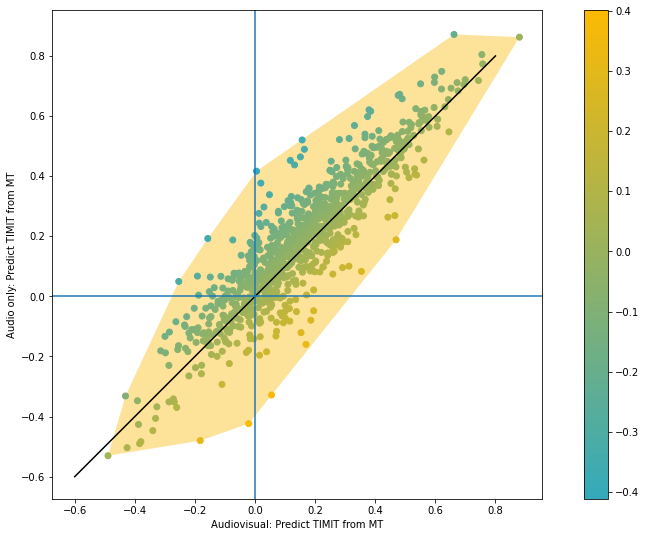

In [43]:
import matplotlib
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
plot_color = '#fcba03'
opacity = 0.4
test_feature = 'audiovisual'
cm=matplotlib.colors.LinearSegmentedColormap.from_list('custom_map', ['#33AABC','#fcba03'], N=256) #create colormap for gradient

fig = plt.figure(figsize=(15,9))
ax = fig.subplots()
points_av = np.hstack(corrs_av).T
points_aud = np.hstack(corrs_audio).T
print(np.shape(corrs_av))
print(np.shape(corrs_audio))
#plt.plot(points_av[:,1], points_aud[:,1], 'b.', alpha=0.5)

    
plt.plot([-0.6, 0.8], [-0.6, 0.8], 'black', label='unity') 

hull1=ConvexHull(np.vstack((points_av[:,1] , points_aud[:,1])).T)
hullv1 = hull1.vertices.copy()
hullv1 = np.append(hullv1, hullv1[0])
print(hullv1)




plt.fill(points_av[hullv1,1], points_aud[hullv1,1], facecolor=plot_color, alpha=opacity, zorder=0, label=test_feature) 
plt.scatter(points_av[:,1], points_aud[:,1], c=points_av[:,1]-points_aud[:,1], cmap=cm)


#plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.xlabel('Audiovisual: Predict TIMIT from MT' )
plt.ylabel('Audio only: Predict TIMIT from MT' )
plt.axis('square')
plt.axvline()
plt.axhline()
plt.colorbar() #difference between av-audio  
plt.savefig('%s/audiovisual_corrs_v_audioOnly.pdf' %(save_dir))

#pairwise between x-y coordinates 

# Supplementary Figure 3 - audiovisual/auditory weights

In [6]:
def plot_weights(subject_list, data_dir, save_dir, feature, stimulus_class, nfeats, nchans = np.arange(64), fs = 128.0, 
                 ndelays = 77, delay_min=0.0, delay_max=0.6, ch=55, save_fig=True):
    print(subject_list)
    print(feature)
    print(stimulus_class)
    print(nfeats)
    wts_matrix = np.zeros((nfeats*ndelays, len(nchans), len(subject_list)))
    print(wts_matrix.shape)
    for idx, s in enumerate(subject_list):
        with h5py.File('%s/%s/%s_STRF_by_%s_%s.hf5'%(data_dir, s, s, feature, stimulus_class), 'r') as fh: #full model
            #corr_vals = fh['corrs_%s' %(stimulus_class.lower())][:]  
            p_vals =  fh['pvals_%s'%(stimulus_class.lower())][:]
            wts = fh['wts_%s'%(stimulus_class.lower())][:]
            wts_matrix[:,:, idx]=wts


    #for audiovisual:
    pitch_labels = np.arange(10).astype(str)

    feat_labels = ['sonorant','obstruent','voiced','back','front','low','high','dorsal', 
    'coronal','labial','syllabic','plosive','fricative','nasal', 'env']

    if feature == 'binned_pitches':
        feat_labels = feat_labels + pitch_labels.tolist()
        
    if feature == 'audiovisual_gabor_sc':
        gabors = np.arange(10).astype(str)
        feat_labels = feat_labels + pitch_labels.tolist() + gabors.tolist() + ['SC']
    if feature == 'phnfeat':
        feat_labels = feat_labels
    
    if feature == 'envs':
        feat_labels = ['env']
    if feature == 'binned_pitch_only':
        feat_labels = pitch_labels

    nfeats = len(feat_labels)
    
    plt.figure(figsize=(8,8)); plt.imshow(wts_matrix.mean(2)[:,ch].reshape(ndelays, nfeats).T, aspect='auto', cmap=cm.RdBu_r, vmin=-np.abs(wts_matrix.mean(2)[:,ch]).max(), vmax=np.abs(wts_matrix.mean(2)[:,ch]).max())

    plt.colorbar()
    t = np.linspace(delay_min, delay_max, ndelays)
    plt.gca().set_xticks([0, (ndelays-1)/2, ndelays-1])
    plt.gca().set_xticklabels([t[0], t[np.int((ndelays-1)/2)], t[ndelays-1]])
    plt.xlabel('Time (seconds)')
    plt.gca().set_yticks(np.arange(len(feat_labels)))
    plt.gca().set_yticklabels(feat_labels)
    plt.title('%s average across subjects for ch %d' %(feature, ch))
    
    if save_fig:
        plt.savefig('%s/%s_weights.pdf' %(save_dir, feature))
        
    return wts_matrix


['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005', 'MT0006', 'MT0008', 'MT0009', 'MT0010', 'MT0011', 'MT0012', 'MT0013', 'MT0014', 'MT0015', 'MT0016', 'MT0017']
audiovisual_gabor_sc
MT
36
(2772, 64, 16)


<ipython-input-6-30c56ffc4735>:44: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.gca().set_xticklabels([t[0], t[np.int((ndelays-1)/2)], t[ndelays-1]])


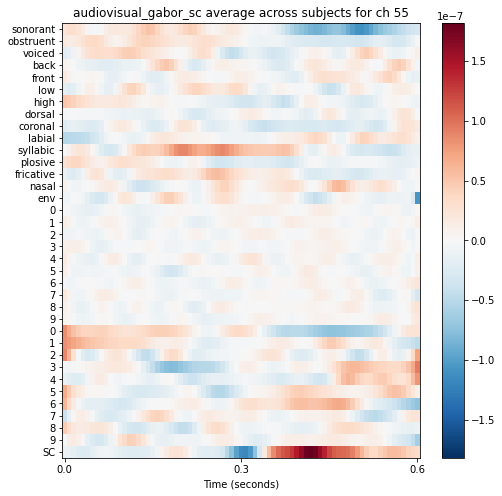

In [7]:
av_wts_matrix = plot_weights(subject_list, data_dir, save_dir, 'audiovisual_gabor_sc', 'MT', 36, save_fig=False)

['MT0001', 'MT0002', 'MT0003', 'MT0004', 'MT0005', 'MT0006', 'MT0008', 'MT0009', 'MT0010', 'MT0011', 'MT0012', 'MT0013', 'MT0014', 'MT0015', 'MT0016', 'MT0017']
binned_pitches
MT
25
(1925, 64, 16)


<ipython-input-6-30c56ffc4735>:44: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.gca().set_xticklabels([t[0], t[np.int((ndelays-1)/2)], t[ndelays-1]])


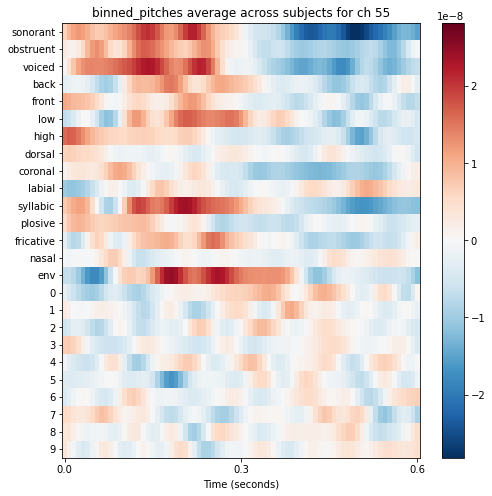

In [8]:
auditory_wts_matrix = plot_weights(subject_list, data_dir, save_dir, 'binned_pitches', 'MT', 25, save_fig=False)

## Plot corr coef. of auditory weights vs. auditory weights form audiovisual matrix 

In [25]:
ndelays=77
aud_only_mat = av_wts_matrix.reshape(ndelays, -1, av_wts_matrix.shape[1], av_wts_matrix.shape[2])
aud_only_mat = aud_only_mat[:, :int(auditory_wts_matrix.shape[0]/ndelays), :, :].reshape(auditory_wts_matrix.shape)
#aud_only_mat = av_wts_matrix[:auditory_wts_matrix.shape[0], :, :] #make audiovisual mat. same size as auditory only
print(aud_only_mat.shape)
nchans = np.arange(64)
wts_corrs_list = np.zeros((len(nchans), len(subject_list)))
for ii, t in enumerate(subject_list):
    for channel in np.arange(64):
        aud_in_av = aud_only_mat[:,channel,ii] #auditory weights matrix taken from audiovisual matrix
        aud_only = auditory_wts_matrix[:,channel,ii] #auditory only weights matrix

        x = np.corrcoef(aud_in_av, aud_only)
        wts_corrs_list[channel,ii] = x[0,1]

wts_corrs_list.shape
print(wts_corrs_list.argmax())
y = wts_corrs_list.argmax()
[time, ch, nsubj] = np.unravel_index(y, (auditory_wts_matrix.shape))

topo_input = wts_corrs_list.mean(1)
print(topo_input.shape)
print(wts_corrs_list.shape)

(1925, 64, 16)
423
(64,)
(64, 16)


Opening raw data file /Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0001/downsampled_128/MT0001_postICA_rejected.fif...


/Users/maansidesai/Desktop/git/NatSpeechEncoding/analysis/run_STRF_analysis.py:67: RuntimeWarning: This filename (/Users/maansidesai/Box/MovieTrailersTask/Data/EEG/Participants/MT0001/downsampled_128/MT0001_postICA_rejected.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  ds = io.read_raw_fif('%s/%s/%s/%s_postICA_rejected.fif'%(data_dir, subject, DS_dir, subject), preload=True)


    Range : 0 ... 450328 =      0.000 ...  3518.188 secs
Ready.
Reading 0 ... 450328  =      0.000 ...  3518.188 secs...
Creating RawArray with float64 data, n_channels=64, n_times=10
    Range : 0 ... 9 =      0.000 ...     0.070 secs
Ready.


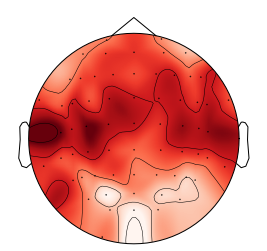

<Figure size 432x288 with 0 Axes>

In [34]:
pitch_labels = np.arange(10).astype(str)
feat_labels = ['sonorant','obstruent','voiced','back','front','low','high','dorsal', 
'coronal','labial','syllabic','plosive','fricative','nasal', 'env']

feat_labels = feat_labels + pitch_labels.tolist()
nfeats = len(feat_labels)
ds = load_ICA_data(subject_list[0], data_dir, file='post_ICA', preload=True)
plt.figure() 
info = mne.create_info(ch_names=ds.info['ch_names'][:64], sfreq=ds.info['sfreq'], ch_types=64*['eeg'])
raw2 = mne.io.RawArray(np.zeros((64,10)), info)

#montage = mne.channels.read_custom_montage('%s/montage/AP-128.bvef' %(data_dir), head_size=0.095, coord_frame=None)
montage = mne.channels.make_standard_montage('standard_1005')
raw2.set_montage(montage)
smax = max(abs(topo_input))
mne.viz.plot_topomap(topo_input, raw2.info, vmin=topo_input.min(), vmax=topo_input.max(), cmap=cm.Reds)
plt.savefig('%s/weights_corrcoef_av_aud_Subjtopo.pdf' %(save_dir))

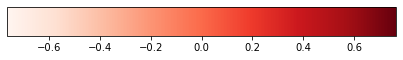

In [35]:
#make color bar for topo map:
fig = plt.figure()
ax = fig.add_axes([0.05, 0.80, 0.9, 0.1])
cb = mpl.colorbar.ColorbarBase(ax, orientation='horizontal', cmap=cm.Reds, norm=mpl.colors.Normalize(-smax, smax))
plt.savefig('%s/colorbar_for_topo_av_aud.pdf' %(save_dir))